# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [1]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

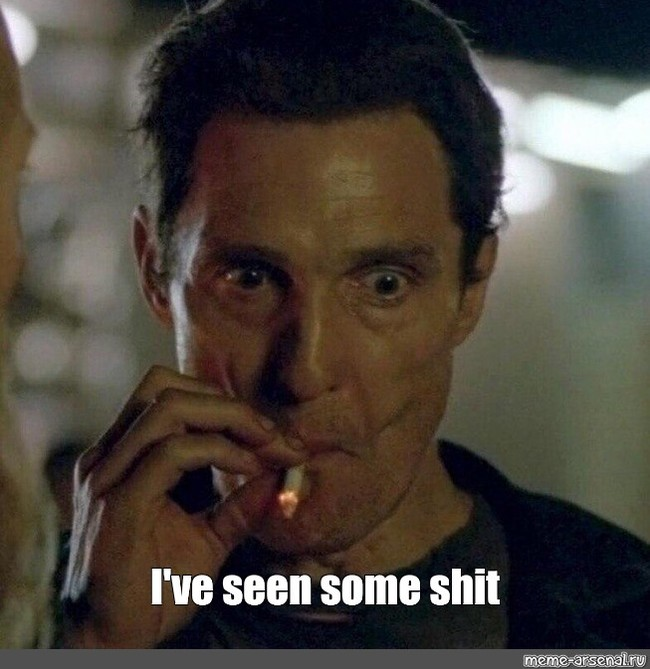

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [2]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from numpy import linalg as LA


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        D = np.diag(X.sum(axis = 0))
        L = D - X
        eigenValues, eigenVectors = LA.eigh(L)

        idx = eigenValues.argsort()[:self.n_components]
        eigenValues = eigenValues[idx]
        eigenVectors = eigenVectors[:,idx]
        return eigenVectors
        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
        raise NotImplementedError


Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [3]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [ ]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


In [ ]:
data['index'] = data.index
data = data.set_index('ID_en')

Воспользуемся библиотекой `folium` для визуализации данных.

In [ ]:
import folium

maps = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(maps)
maps

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [ ]:
s = set()

def str_to_array(row):
  row = row.split('; ')
  s.update(row)
  return row

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    data['RouteNumbers_en'] = data['RouteNumbers_en'].apply(str_to_array)
    routes = {}
    for key in s:
      routes[key] = list(data[data['RouteNumbers_en'].apply(lambda x: key in x)].index)

    return routes



def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''

    for route in routes:
      unsrtd = routes[route]
      srtd = []

      x = np.array(data.loc[unsrtd]['Longitude_WGS84_en'])
      y = np.array(data.loc[unsrtd]['Latitude_WGS84_en'])
      idx = None

      # здесь реализовывается алгоритм добавления остановок в маршрут
      while len(unsrtd) > 1:

        if len(srtd) == 0:
          last_x = x[:, np.newaxis]
          last_y = y[:, np.newaxis]
        else:
          last_x = x[idx]
          last_y = y[idx]
          x = np.delete(x, idx)
          y = np.delete(y, idx)

        x_diffs = last_x - x
        y_diffs = last_y - y

        # Возводим разности в квадрат
        x_squared_diffs = x_diffs ** 2
        y_squared_diffs = y_diffs ** 2
        # Суммируем квадраты разностей для каждого элемента
        if len(srtd) == 0:
          x_squared_diffs = x_squared_diffs.sum(axis=1)
          y_squared_diffs = y_squared_diffs.sum(axis=1)


        distance = np.sqrt(x_squared_diffs + y_squared_diffs)
        if len(srtd) == 0:
          idx = np.argmax(distance)
        else:
          idx = np.argmin(distance)
        srtd.append(unsrtd[idx])
        unsrtd.pop(idx)

      srtd.append(unsrtd[0])
      routes[route] = srtd

    return routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    ad_mat = np.zeros((data.shape[0], data.shape[0]))
    for route in sorted_routes:
      for i in range(0, len(sorted_routes[route]) - 1):
        i_index = data.loc[sorted_routes[route][i]]['index']
        j_index = data.loc[sorted_routes[route][i + 1]]['index']
        ad_mat[i_index, j_index] += 1
        ad_mat[j_index, i_index] += 1

    return ad_mat

In [ ]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [ ]:
maps = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(maps)

maps

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [ ]:
import matplotlib.colors as colors
import matplotlib.cm as cm
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    colors_array = cm.rainbow(np.linspace(0, 1, np.unique(labels).shape[0])) # не забыдь, что тут может быть минус 1 надо будет сделать
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    maps = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():

      folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en], radius=10, color = rainbow[labels[row['index']]]).add_to(maps)

    return maps


[https://www.kaggle.com/code/lucaspcarlini/clustering-and-visualisation-using-folium-maps](https://)

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [ ]:
X = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']]
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=0, n_init="auto").fit(X)
draw_clustered_map(data, kmeans.labels_)

In [ ]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=0.00395).fit(X)
draw_clustered_map(data, clustering.labels_)

In [ ]:
graph_clustering = GraphClustering(n_clusters=8, n_components = 25)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

1. Ну явно **DBSCAN** отличается тем, что есть выбросы среди практически любого кластера (на моем рисунке это красные точки). Соответственно главный плюс у него именно такой. Минус в том, что выделяются какие-то слабые кластеры, не особо интерпретириуемые и в разных места (например на моей карте это голубоватые и бирюзовые точки)

2. У **спектральной кластеризации** достаточно обширный захват точек для какого одного кластера (зеленые и желтые точки). Нету выбросов - это возможно как минус. Также есть некоторые проблемы как у DBSCAN: в разных местах одинакового цвета точки. Плюс в том, что как раз благодаря обширному захвату нету какой-то суперцветовой палитры как у того же DBSCAN

3. **K-means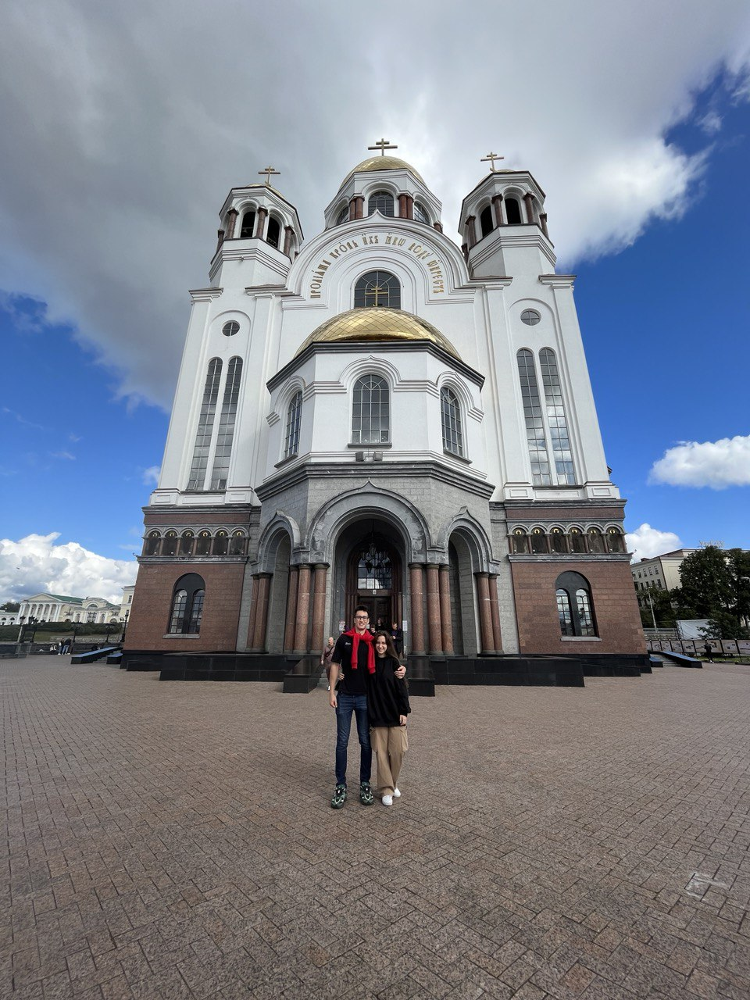** самый оптимальный для этой кластеризации, это видно по рисунку. Плюсы: достаточно четко определены кластеры, без какого-либо множества разных точек в одном месте. Также он четко определяет конкретные кластеры равные гиперпараметру (у каждого кластера достаточное количество точек), разбиение достаточно интерпретируемо. Минусы: нет выбросов

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [2]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [3]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [4]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [5]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [6]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [7]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

In [ ]:
data.text[0]

'ad sale boost time warner profit quarterly profit u medium giant timewarner jumped three month december firm one biggest investor google benefited sale internet connection higher advert sale timewarner fourth quarter sale rose profit buoyed gain offset profit dip warner bros le user aol time warner friday owns google internet business aol mixed fortune lost subscriber fourth quarter profit lower preceding three quarter however company aol underlying profit exceptional item rose back stronger internet advertising revenue hope increase subscriber offering online service free timewarner internet customer try sign aol existing customer broadband timewarner also restate result following probe u security exchange commission sec close concluding time warner fourth quarter profit slightly better analyst expectation film division saw profit slump helped flop alexander catwoman sharp contrast third final film lord ring trilogy boosted result timewarner posted profit performance revenue grew fin

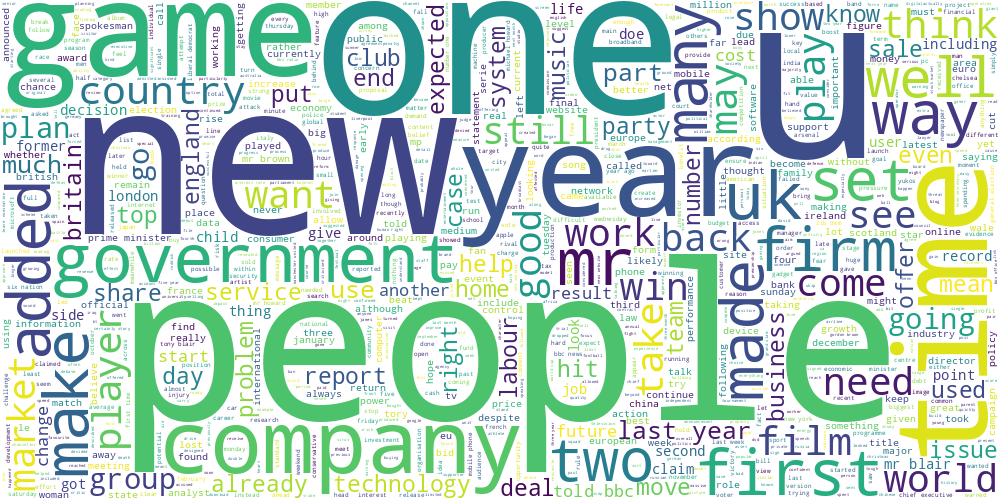

In [ ]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [8]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
vectorizer = TfidfVectorizer(min_df = 0.005)
X_tf_idf = vectorizer.fit_transform(data['text'])

kmeans = KMeans(n_clusters=6, random_state=0, n_init="auto").fit(X_tf_idf)
clusters = []
for cluster_id in range(6):
    cluster_indices = np.where(kmeans.labels_ == cluster_id)[0]
    clusters.append(data['text'][cluster_indices])

совсем немного кода взял отсюда: [https://habr.com/ru/companies/otus/articles/755772/](https://)

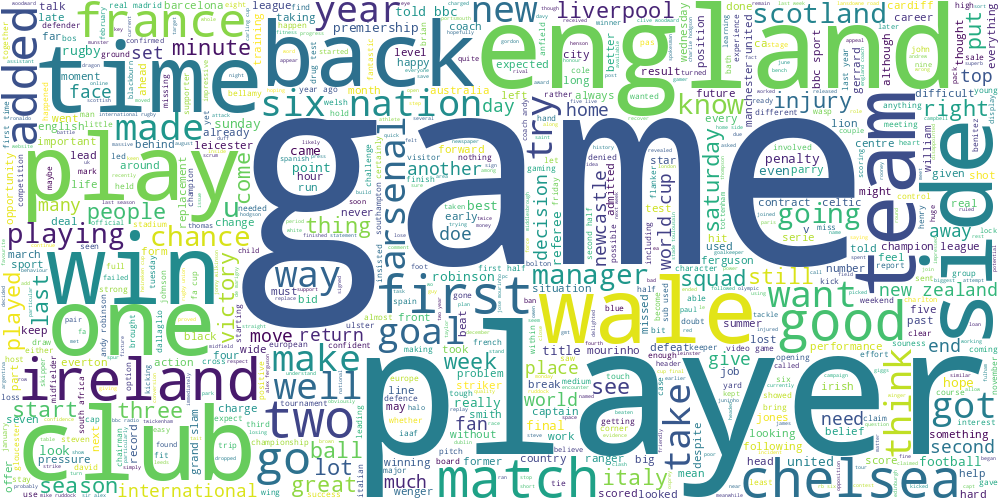

In [ ]:
draw_wordcloud(clusters[0])

**Football in England**

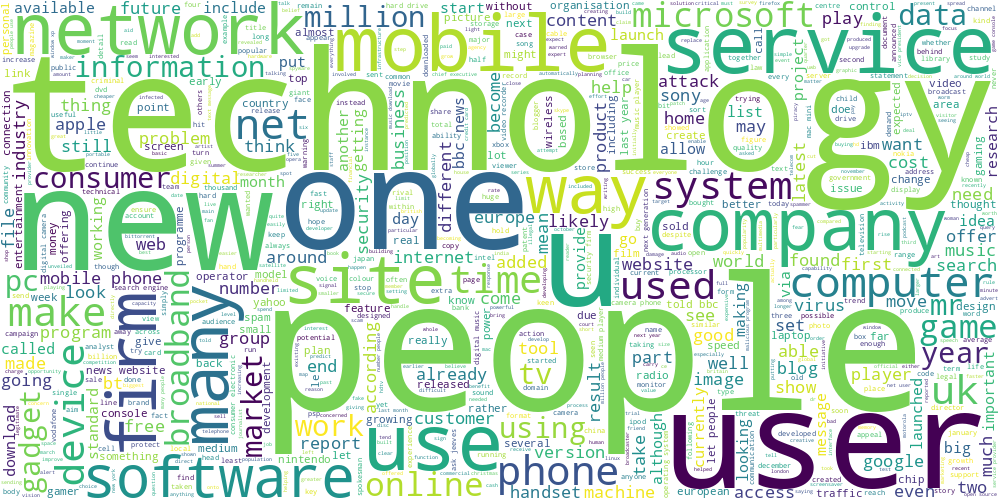

In [ ]:
draw_wordcloud(clusters[1])

**IT**

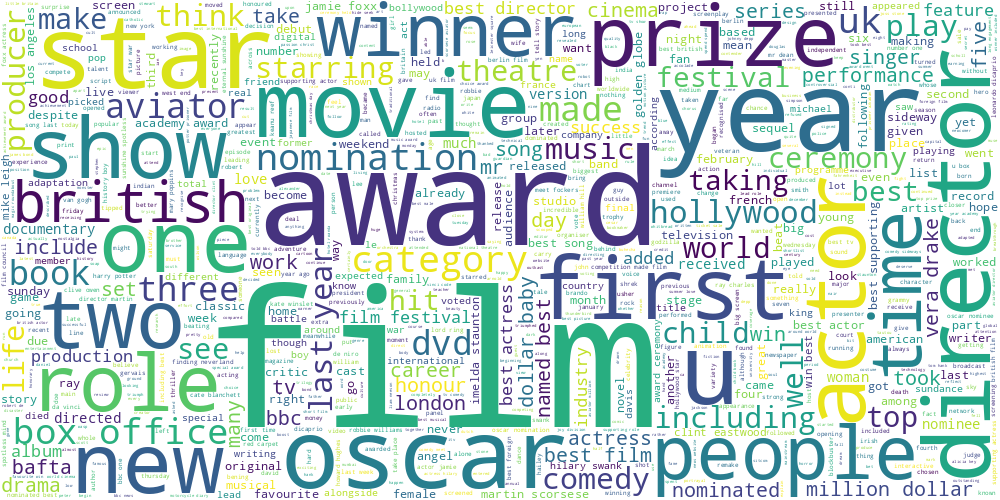

In [ ]:
draw_wordcloud(clusters[2])

**Moovie industry**

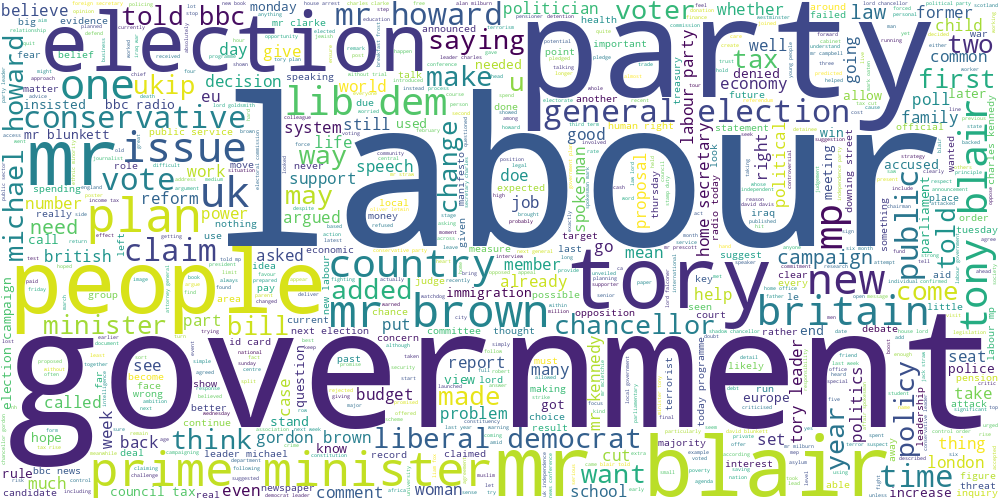

In [ ]:
draw_wordcloud(clusters[3])

**Politics**

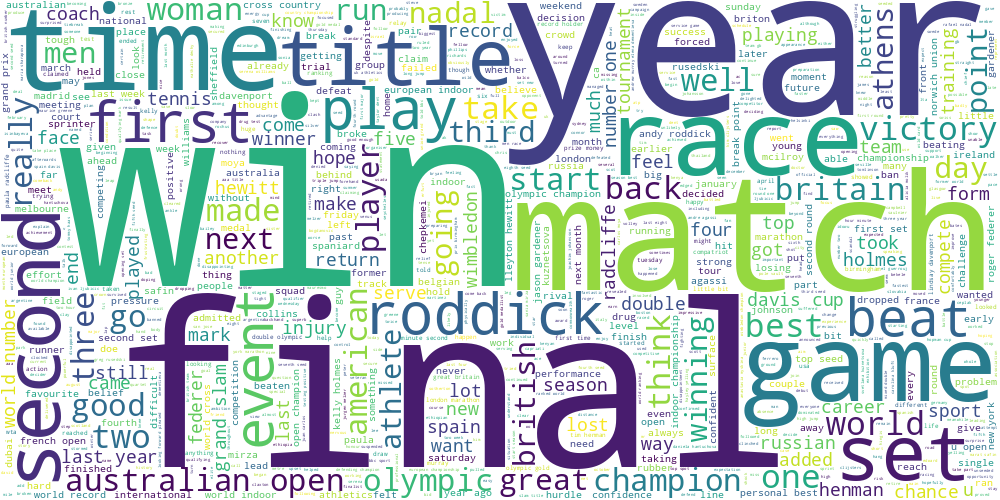

In [ ]:
draw_wordcloud(clusters[4])

**Tennis**

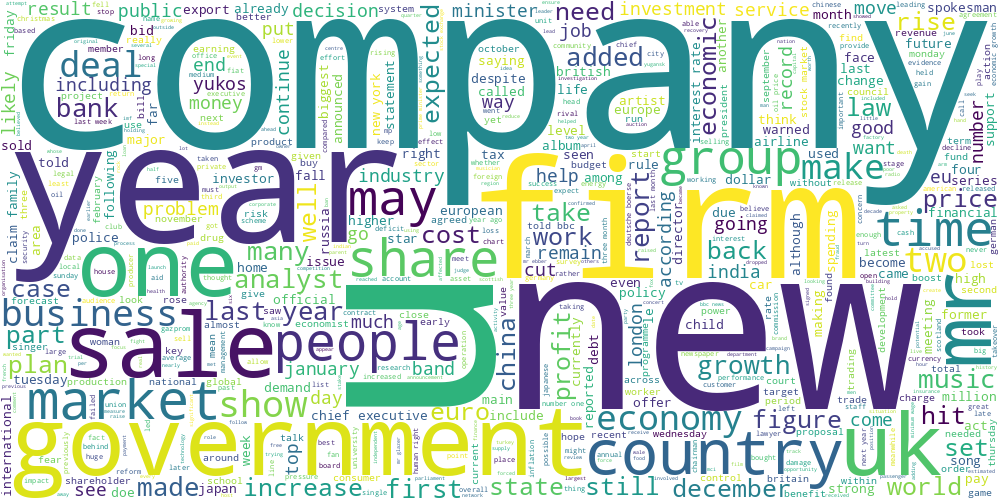

In [ ]:
draw_wordcloud(clusters[5])

**Economics**

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

Итак, мои озаглавленные темы:

Cluster 0: Football in England

Cluster 1: IT

Cluster 2: Moovie industry

Cluster 3: Politics

Cluster 4: Tennis

Cluster 5: Economics

In [ ]:
keys = list(vectorizer.vocabulary_.keys())
values = list(vectorizer.vocabulary_.values())

for i in enumerate(np.argmax(kmeans.cluster_centers_, axis=1)):
  print(f'Cluster {i[0]}: {keys[values.index(i[1])]}')

Cluster 0: game
Cluster 1: mobile
Cluster 2: film
Cluster 3: mr
Cluster 4: champion
Cluster 5: year


Слова определенно согласуются с озаглавленными темами, тем более с облаками тегов

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [94]:
from sklearn.cluster import SpectralClustering
from sklearn.cluster import DBSCAN
spectral = SpectralClustering(n_clusters=6).fit_predict(X_tf_idf)
k_means = KMeans(n_clusters=6).fit_predict(X_tf_idf)
dbscan = DBSCAN(eps = 0.83).fit_predict(X_tf_idf)
clusters = [k_means, dbscan, spectral]
titles = ['K-Means', 'DBSCAN', 'Spectral']

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, init = 'random')
projections = tsne.fit_transform(X_tf_idf)

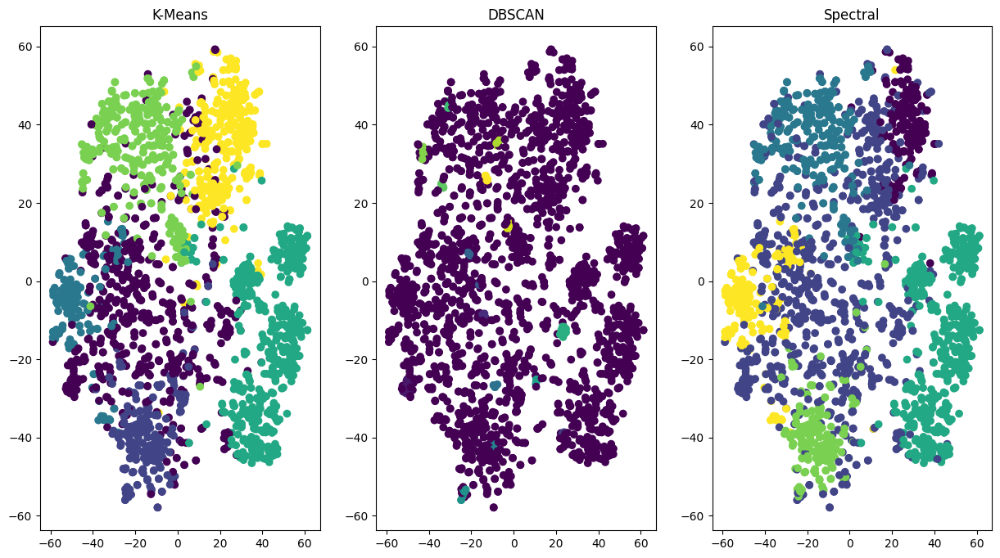

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize= (15,8))
for i in range(1,4):

    plt.subplot(1,3,i)
    plt.scatter(projections[:,0], projections[:,1], c = clusters[i - 1])
    plt.title(titles[i - 1])

plt.show()

In [ ]:
# здесь просто показываю, что число кластеров у dbscan совпадает с k-means
dbscan = DBSCAN(eps = 0.83).fit(X_tf_idf)
if -1 in set(dbscan.labels_):
  print(len(set(dbscan.labels_)) - 1)
else:
  print(len(set(dbscan.labels_)))


6


Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

Ну тут сразу видно, что достаточно равномерный баланс классов у K-means и Spectral, а вот DBSCAN показывает явное преобладание какого-то одного конкретного кластера.

Результаты по K-means и Spectral соотносятся, а вот с DBSCAN несовсем, потому что тут я подбирал eps для конкретного количества кластеров. А на географических данных я подбирал eps для более менее интерпретируемой визуализации.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [9]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

count_vectorizer = CountVectorizer()
X_bow = count_vectorizer.fit_transform(data['text'])
lda = LatentDirichletAllocation(n_components=15)
labels = np.argmax(lda.fit_transform(X_bow), axis=1)

clusters = []
for cluster_id in range(15):
    cluster_indices = np.where(labels == cluster_id)[0]
    clusters.append(data['text'][cluster_indices])

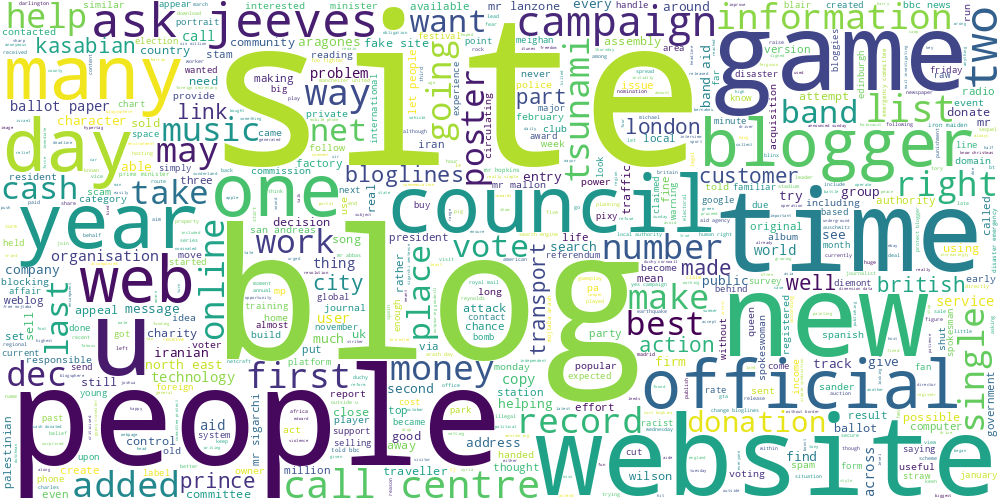

In [ ]:
draw_wordcloud(clusters[2])

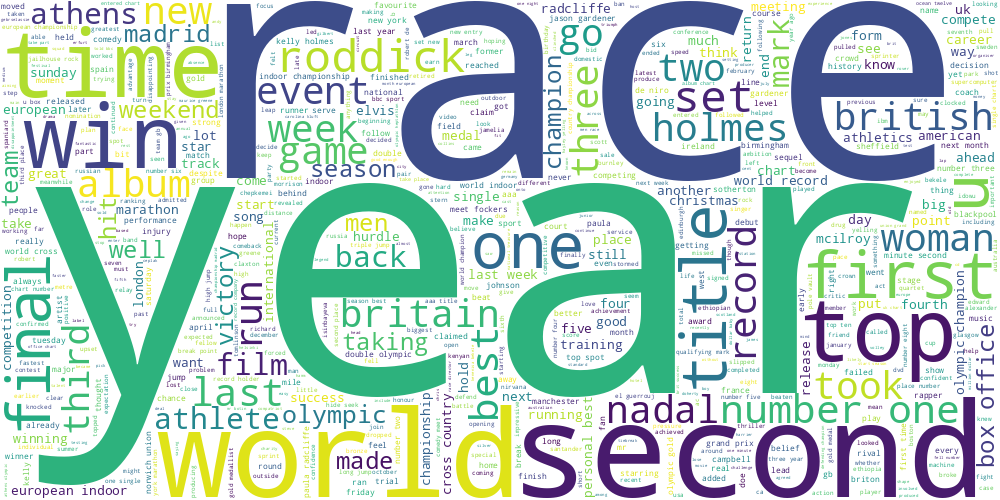

In [ ]:
draw_wordcloud(clusters[4])

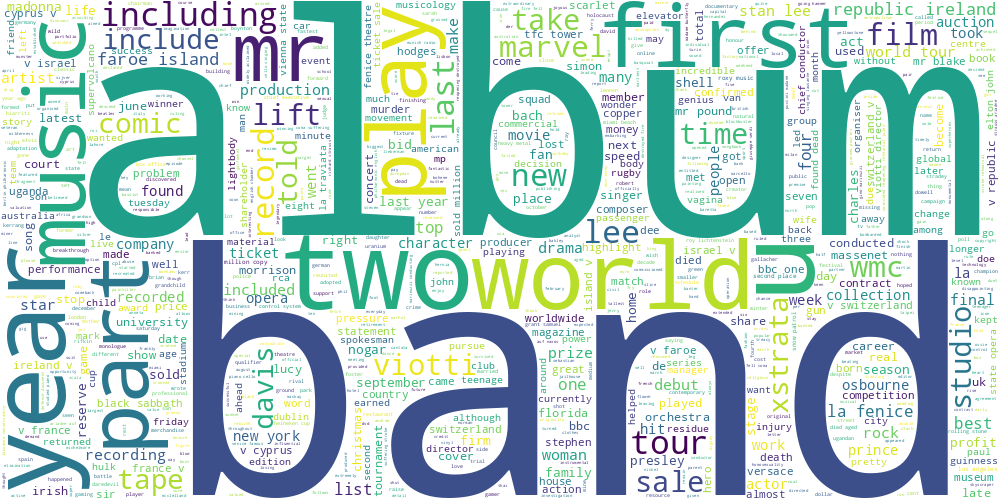

In [ ]:
draw_wordcloud(clusters[8])

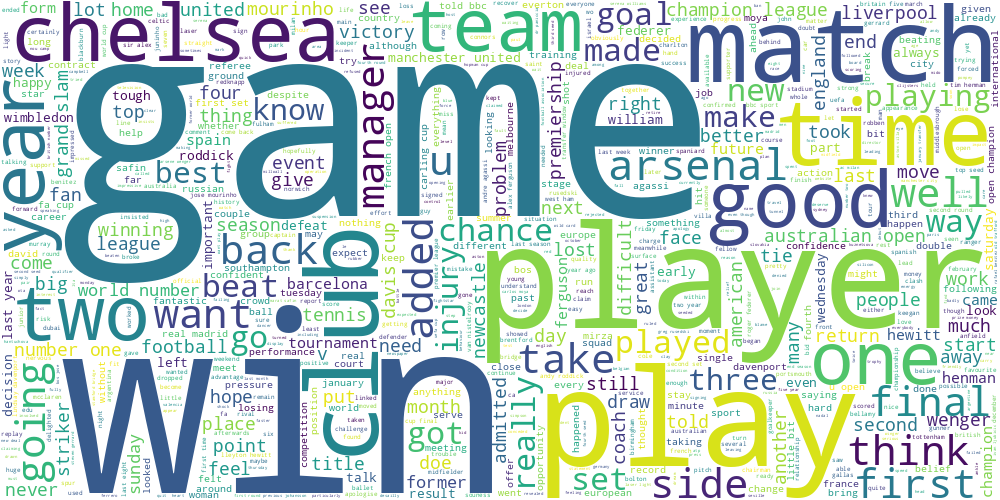

In [ ]:
draw_wordcloud(clusters[11])

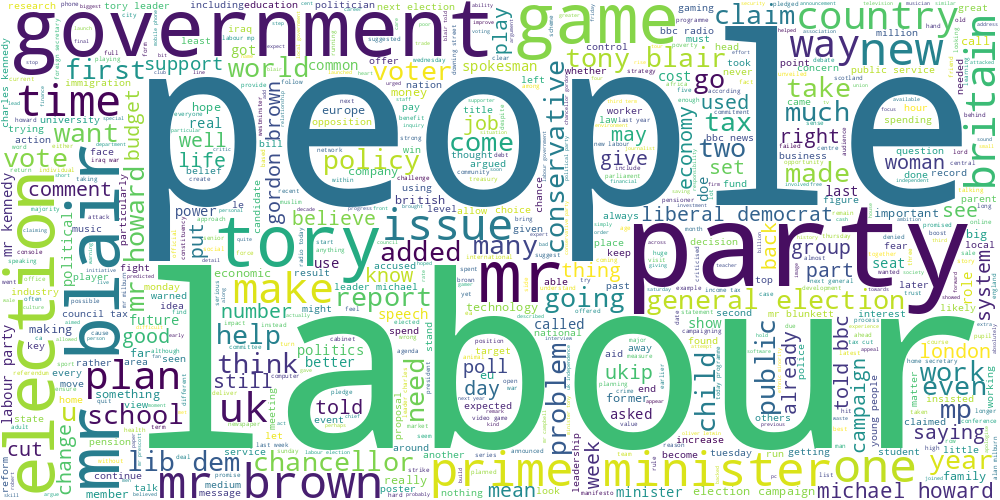

In [ ]:
draw_wordcloud(clusters[12])

Видно, что темы начинают немного сужаться, появляются отдельные темы, связанные с музыкой, с хостингом и специфической областью в политике (право, партии, выборы и т.д.)

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [45]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.decomposition import LatentDirichletAllocation
le = LabelEncoder()
data['category_coded'] = le.fit_transform(data['category'])
y=data['category_coded']
accs_train = []
accs_test = []
X_train, X_test, y_train, y_test = train_test_split(data['text'], y)

In [11]:
X_train_tf_idf = X_tf_idf[X_train.index]
X_test_tf_idf = X_tf_idf[X_test.index]
logreg = LogisticRegression()
logreg.fit(X_train_tf_idf, y_train)
pred_train = logreg.predict(X_train_tf_idf)
pred_test = logreg.predict(X_test_tf_idf)

accs_train.append(accuracy_score(pred_train, y_train))
accs_test.append(accuracy_score(pred_test, y_test))

In [12]:
k_means = KMeans()
k_means.fit(X_tf_idf)
distances = ((X_tf_idf.toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5) # считаю расстояния до центров кластеров

X_train_kmeans = distances[X_train.index]
X_test_kmeans = distances[X_test.index]

logreg = LogisticRegression()
logreg.fit(X_train_kmeans, y_train)
pred_train = logreg.predict(X_train_kmeans)
pred_test = logreg.predict(X_test_kmeans)

accs_train.append(accuracy_score(pred_train, y_train))
accs_test.append(accuracy_score(pred_test, y_test))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [13]:
lda = LatentDirichletAllocation()
probs = lda.fit_transform(X_bow)

X_train_lda = probs[X_train.index]
X_test_lda = probs[X_test.index]

logreg = LogisticRegression()
logreg.fit(X_train_lda, y_train)
pred_train = logreg.predict(X_train_lda)
pred_test = logreg.predict(X_test_lda)

accs_train.append(accuracy_score(pred_train, y_train))
accs_test.append(accuracy_score(pred_test, y_test))

In [30]:
titles = ['TF-IDF', 'K-means', 'LDA']
res1 = pd.DataFrame(data={'train':accs_train, 'test':accs_test}, index = titles)
res1

,train,test
TF-IDF,0.995204,0.971275
K-means,0.884293,0.890485
LDA,0.899281,0.901257


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**

Лучшее качество получилось на TF-IDF признаках:

Мы не подбирали количество кластеров, а это все таки очень важный гиперпараметр, от которого зависит дальнейшее обучение модели. С точки зрения интерпретации, количество кластеров должно совпадать с количеством различных классов в разметке


**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [48]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=30)
X_train_marked, X_train_not_marked, y_train_marked, y_train_not_marked = train_test_split(X_train, y_train, test_size=0.65 / 0.7)
metrics = []

Здесь подбираю min_df

In [16]:
for i in np.linspace(0.008, 0.1, 20):
  vectorizer = TfidfVectorizer(min_df = i)
  unsupervised = np.hstack((X_train_marked, X_train_not_marked))
  vectorizer.fit(unsupervised)
  train_marked = vectorizer.transform(X_train_marked)
  logreg = LogisticRegression()
  logreg.fit(train_marked, y_train_marked)
  pred_val = logreg.predict(vectorizer.transform(X_val))


  print(accuracy_score(pred_val, y_val), i)


0.6333333333333333 0.008
0.7 0.012842105263157894
0.7 0.01768421052631579
0.7 0.022526315789473686
0.7 0.02736842105263158
0.7333333333333333 0.032210526315789474
0.7666666666666667 0.03705263157894737
0.7333333333333333 0.04189473684210526
0.7333333333333333 0.04673684210526316
0.7333333333333333 0.05157894736842106
0.7333333333333333 0.05642105263157895
0.7333333333333333 0.061263157894736846
0.7 0.06610526315789475
0.7 0.07094736842105265
0.7 0.07578947368421052
0.6666666666666666 0.08063157894736842
0.6333333333333333 0.08547368421052631
0.6 0.09031578947368421
0.6 0.09515789473684211
0.6333333333333333 0.1


In [34]:
vectorizer = TfidfVectorizer(min_df = 0.037)
unsupervised = np.hstack((X_train_marked, X_train_not_marked))
vectorizer.fit(unsupervised)
train_marked = vectorizer.transform(X_train_marked)
logreg = LogisticRegression()
logreg.fit(train_marked, y_train_marked)
pred_test = logreg.predict(vectorizer.transform(X_test))
metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)

0.8635547576301615

Здесь tf-idf заново не обучаем, а пользуемся тем, что сделали в предыдущей

In [24]:
for cluster in range(20, 60, 2):
  k_means = KMeans(n_clusters=cluster)
  k_means.fit(vectorizer.transform(unsupervised))
  distances_train = ((train_marked.toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5) # считаю расстояния до центров кластеров
  distances_val = ((vectorizer.transform(X_val).toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5)
  logreg = LogisticRegression()
  logreg.fit(distances_train, y_train_marked)

  pred_val = logreg.predict(distances_val)
  print(accuracy_score(pred_val, y_val), cluster)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.5 20


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.5333333333333333 22


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6 24


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.5333333333333333 26


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6 28


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6 30


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.6666666666666666 32


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.6 34


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.5666666666666667 36


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.6 38


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 40


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 42


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.6333333333333333 44


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 46


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7333333333333333 48


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.6666666666666666 50


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 52


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 54


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.7 56


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.7 58


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [35]:
k_means = KMeans(n_clusters=48)
k_means.fit(vectorizer.transform(unsupervised))
distances_train = ((train_marked.toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5) # считаю расстояния до центров кластеров
distances_test = ((vectorizer.transform(X_test).toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5)
logreg = LogisticRegression()
logreg.fit(distances_train, y_train_marked)

pred_test = logreg.predict(distances_test)

metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.8473967684021544

In [26]:
count_vectorizer = CountVectorizer()
count_vectorizer.fit(unsupervised)
for component in range(5, 25):
  lda = LatentDirichletAllocation(n_components=component)
  lda.fit(count_vectorizer.transform(unsupervised))

  probs_train = lda.transform(count_vectorizer.transform(X_train_marked))
  probs_val = lda.transform(count_vectorizer.transform(X_val))

  logreg = LogisticRegression()
  logreg.fit(probs_train, y_train_marked)

  pred_val = logreg.predict(probs_val)

  print(accuracy_score(pred_val, y_val), component)

0.6666666666666666 5
0.7 6
0.8333333333333334 7
0.7666666666666667 8
0.7333333333333333 9
0.9 10
0.7333333333333333 11
0.8 12
0.9 13
0.8333333333333334 14
0.8666666666666667 15
0.7666666666666667 16
0.7666666666666667 17
0.6666666666666666 18
0.8333333333333334 19
0.8 20
0.6 21
0.6666666666666666 22
0.7333333333333333 23
0.8 24


In [36]:
lda = LatentDirichletAllocation(n_components=10)
lda.fit(count_vectorizer.transform(unsupervised))

probs_train = lda.transform(count_vectorizer.transform(X_train_marked))
probs_test = lda.transform(count_vectorizer.transform(X_test))

logreg = LogisticRegression()
logreg.fit(probs_train, y_train_marked)

pred_test = logreg.predict(probs_test)

metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)

0.9102333931777379

In [40]:
res2 = pd.DataFrame(data={'test':metrics}, index = titles)
res1

,train,test
TF-IDF,0.995204,0.971275
K-means,0.884293,0.890485
LDA,0.899281,0.901257


In [41]:
res2

,test
TF-IDF,0.863555
K-means,0.847397
LDA,0.910233


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

Неудивительно что в абсолютном сравнении метрика просела (кроме LDA): мы оставили совсем немного разметки.

Однако важный момент в том, что значение метрики в целом очень неплохое, если бы сравнивали не только accuracy, а например какой-нибудь баланс между accuracy и количеством размеченных данных, то скорее всего второй кейс показал бы себя  гораздо лучше, потому что как минимум мы тут подбирали гиперпараметры и уделяли достаточное внимание обобщающей способности модели.

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

Здесь получается у 5% среди 70% нужно оставить разметку, а у 65% удалить. А на валидации также попробовать подобрать параметры

In [57]:
from sklearn.semi_supervised import SelfTrainingClassifier
y_train[X_train_not_marked.index] = -1
semi_supervised_metrics = []

In [56]:
for i in np.linspace(0.5, 0.99, 20):
  self_training_model = SelfTrainingClassifier(LogisticRegression(), threshold=i)
  self_training_model.fit(vectorizer.transform(X_train), y_train)
  pred_val = self_training_model.predict(vectorizer.transform(X_val))


  print(accuracy_score(pred_val, y_val), i)

0.8 0.5
0.8 0.5257894736842105
0.8 0.5515789473684211
0.7 0.5773684210526315
0.7 0.6031578947368421
0.7333333333333333 0.6289473684210526
0.5666666666666667 0.6547368421052632
0.5666666666666667 0.6805263157894736
0.43333333333333335 0.7063157894736842
0.6666666666666666 0.7321052631578947
0.9 0.7578947368421052
0.9 0.7836842105263158
0.9 0.8094736842105263
0.9 0.8352631578947368
0.9 0.8610526315789473
0.9 0.8868421052631579
0.9 0.9126315789473685
0.9 0.9384210526315789
0.9 0.9642105263157894
0.9 0.99


In [58]:
self_training_model = SelfTrainingClassifier(LogisticRegression(), threshold=0.83)
self_training_model.fit(vectorizer.transform(X_train), y_train)
pred_test = self_training_model.predict(vectorizer.transform(X_test))

semi_supervised_metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)



0.8689407540394973

В целом уже везде гиперпараметры поддобраны через валидацию, поэтому дальше просто прогоним по тесту на моделях

In [59]:
distances_train = ((vectorizer.transform(X_train).toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5) # считаю расстояния до центров кластеров
distances_test = ((vectorizer.transform(X_test).toarray()[:, np.newaxis, :] - k_means.cluster_centers_) ** 2).sum(axis = 2) ** (0.5)
self_training_model = SelfTrainingClassifier(LogisticRegression(), threshold=0.83)
self_training_model.fit(distances_train, y_train)
pred_test = self_training_model.predict(distances_test)


semi_supervised_metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

0.8366247755834829

In [60]:
probs_train = lda.transform(count_vectorizer.transform(X_train))
probs_test = lda.transform(count_vectorizer.transform(X_test))
self_training_model = SelfTrainingClassifier(LogisticRegression(), threshold=0.83)
self_training_model.fit(probs_train, y_train)

pred_test = self_training_model.predict(probs_test)

semi_supervised_metrics.append(accuracy_score(pred_test, y_test))
accuracy_score(pred_test, y_test)

0.8096947935368043

In [61]:
semi_supervised_metrics

[0.8689407540394973, 0.8366247755834829, 0.8096947935368043]

Результаты ухудшились, скорее всего потому что нужно по другому подбирать гиперпараметры, либо заново аккуратно обучать все векторайзеры и тд. Скорее всего, если еще загоним валидацию на обучение, то результат будет гораздо лучше

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [62]:
!pip install bcubed
bcubed_metrics = dict()

код взял вот отсюда: [https://github.com/hhromic/python-bcubed](https://)

Разумно будет сравнивать по это метрике, когда у алгоритмов кластеризации количество кластероы совпадает с количеством кластеров на самом деле

In [92]:
# K_means
import bcubed
k_means = KMeans(n_clusters=6)
cl = k_means.fit_predict(X_tf_idf)
gold_standard = y
cdict = dict(enumerate(map(lambda x:{x}, cl)))
ldict = dict(enumerate(map(lambda x:{x}, gold_standard)))
precision = bcubed.precision(cdict, ldict)
recall = bcubed.recall(cdict, ldict)

bcubed_metrics['k_means'] = bcubed.fscore(precision, recall)

In [95]:
# DBSCAN
cl = DBSCAN(eps = 0.83).fit_predict(X_tf_idf)
cdict = dict(enumerate(map(lambda x:{x}, cl)))

precision = bcubed.precision(cdict, ldict)
recall = bcubed.recall(cdict, ldict)
bcubed_metrics['dbscan'] = bcubed.fscore(precision, recall)

In [96]:
# SPECTRAL
cl = SpectralClustering(n_clusters=6).fit_predict(X_tf_idf)
cdict = dict(enumerate(map(lambda x:{x}, cl)))

precision = bcubed.precision(cdict, ldict)
recall = bcubed.recall(cdict, ldict)
bcubed_metrics['spectral'] = bcubed.fscore(precision, recall)

In [97]:
bcubed_metrics

{'k_means': 0.6744430383234999,
 'dbscan': 0.35878167365851504,
 'spectral': 0.6294150161603851}

Ну k-means проявило себя лучше всех, а dbscan наоборот. Это вполне логично, если вспомним задание, где изображали баланс классов после этих  трех алгоритмов кластеризации

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Отчет доступен по ссылке:

[https://docs.google.com/document/d/11VxuL6AicBugOuwvMnKLNOeku8UCO3-2u4oeWqHwSdw/edit?usp=sharing](https://)